In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter

%matplotlib inline

In [2]:
np.set_printoptions(suppress=True)                 # prevent numpy to print in exponential form (scientific with e^x)

In [3]:
# manual input

refPEEQ_file = 'compPEEQ_450um_middleStrip.csv'    # for waviness: strain path of component model
# refPEEQ_file = 'compPEEQ_30um_middleStrip.csv'     # for roughness: strain path of component model

timeStep_odb = 80                                  # number of timestep
localPnt_no = 3                                    # amount of selected local point

In [4]:
# select local point for 3D plot

localPnt_for3D = 1

In [5]:
# load data

# mises = pd.read_csv('mises.csv').values
peeq = pd.read_csv('peeq.csv').values
triax = pd.read_csv('triax.csv').values
lode = pd.read_csv('lode.csv').values
volume = pd.read_csv('volume.csv').values

**Initialize data**

In [6]:
# initialize component data

refPEEQ = np.genfromtxt(refPEEQ_file, delimiter=',', skip_header=1)

compTriax = [eta for [peeq, eta, theta] in refPEEQ]
compLode = [theta for [peeq, eta, theta] in refPEEQ]
compPeeq = [peeq for [peeq, eta, theta] in refPEEQ]

In [7]:
# initialize odb time frame data

timeStep = np.arange(1, timeStep_odb+1)

In [8]:
# DIL for 3D graph

c1 = 0.4
c2 = 1
c3 = 0.1
c4 = 1.5
c5 = 0.4
c6 = 1


# prepare x-point and y-point to cal in equation
data_pnts = 100

df_x = pd.DataFrame(np.zeros((2*data_pnts, 2*data_pnts)))
for i in range(2*data_pnts):
    df_x.iloc[i,:] = np.arange(-1, 1, 1/data_pnts)                      # row by rows
    
df_y = pd.DataFrame(np.zeros((2*data_pnts, 2*data_pnts)))
for i in range(2*data_pnts):
    df_y.iloc[:,i] = np.arange(-1, 1, 1/data_pnts)                      # column by columns


# construct DIL
df_DIL = ( c1*np.exp(-c2*df_x) - c3*np.exp(-c4*df_x) ) * df_y.pow(2) + c3*np.exp(-c4*df_x)

In [9]:
# DIL for 2D graph

## lode = 0.2 = constant
DILTriax = np.arange(-1.05, 1.05, 0.05)
ConstLode = np.ones(len(DILTriax)) * 0.2
DIL_constLode = ( c1*np.exp(-c2*DILTriax) - c3*np.exp(-c4*DILTriax) ) * np.power(ConstLode,2) + c3*np.exp(-c4*DILTriax)

## Triax = 0.2 = constant
DILLode = np.arange(-1.05, 1.05, 0.05)
ConstTriax = np.ones(len(DILLode)) * 0.2
DIL_constTriax = ( c1*np.exp(-c2*ConstTriax) - c3*np.exp(-c4*ConstTriax) ) * np.power(DILLode,2) + c3*np.exp(-c4*ConstTriax)

**Calculate global variables**

In [10]:
globalvolume = volume.sum(axis=1)
globalTriax = np.sum(triax * volume, axis=1)/globalvolume
globalLode = np.sum(lode * volume, axis=1)/globalvolume
globalPeeq = np.sum(peeq * volume, axis=1)/globalvolume

In [11]:
# prepare global dataframe

data_global = {'globalTriax': globalTriax, 'globalLode': globalLode, 'globalPeeq': globalPeeq} 
df_global = pd.DataFrame(data_global)


eta = globalTriax
theta = globalLode
DIL = ( c1*np.exp(-c2*eta) - c3*np.exp(-c4*eta) ) * np.power(theta,2) + c3*np.exp(-c4*eta)
df_global['globalDIL'] = np.around(DIL,3)


# PEEQ reach DIL not-considered strain path increment
df_global['globalPEEQ > DIL'] = np.where(
    df_global['globalPeeq'] >= df_global['globalDIL'],
    1,
    0,
)


# PEEQ reach DIL considered strain path increment
diffPeeq = np.diff(np.around(globalPeeq,4))
delPeeq = np.append(0, diffPeeq)
df_global['global-delPEEQ/DIL'] = delPeeq / DIL

delPeeqByDIL = df_global['global-delPEEQ/DIL'].values
df_global['global-DILaccu'] = np.cumsum(delPeeqByDIL)

df_global['global-DILaccu > 1'] = np.where(
    df_global['global-DILaccu'] >= 1.0,
    1,
    0,
)


df_global.head()

,globalTriax,globalLode,globalPeeq,globalDIL,globalPEEQ > DIL,global-delPEEQ/DIL,global-DILaccu,global-DILaccu > 1
0,-0.056974,0.037068,0.011472,0.109,0,0.0,0.0,0
1,-0.056941,-0.005293,0.011472,0.109,0,0.0,0.0,0
2,-0.059043,-0.003292,0.011472,0.109,0,0.0,0.0,0
3,0.027373,0.063578,0.011472,0.097,0,0.0,0.0,0
4,0.131116,0.209994,0.011472,0.094,0,0.0,0.0,0


In [12]:
# find brokenStep

globalBrokenStep = 0

for i in range(timeStep_odb):
    if df_global.at[i,'global-DILaccu > 1'] == 1:
        globalBrokenStep = i+1
        break

print(globalBrokenStep)

28


In [13]:
df_global.to_csv('globalVar.csv', index=False)

In [14]:
# find first and last index for graph plot (from plasticity until fracture regime)

df_global_plot = pd.DataFrame()

plot_start_i = 0
plot_end_i = timeStep_odb-1

for i in range(timeStep_odb):
    if df_global.at[i,'global-delPEEQ/DIL'] != 0:
        plot_start_i = i
        break
        
for i in range(timeStep_odb):
    if np.absolute(df_global.at[timeStep_odb-1-i,'globalTriax'] - df_global.at[timeStep_odb-2-i,'globalTriax']) < 0.005:
        plot_end_i = timeStep_odb-2-i
        break
        
df_global_plot = df_global.iloc[plot_start_i:plot_end_i]
        
print(plot_start_i)
print(plot_end_i)
df_global_plot.head()

7
73


,globalTriax,globalLode,globalPeeq,globalDIL,globalPEEQ > DIL,global-delPEEQ/DIL,global-DILaccu,global-DILaccu > 1
7,0.146943,0.513309,0.011734,0.150,0,0.001333,0.001333,0
8,0.145425,0.481877,0.012943,0.142,0,0.008448,0.009781,0
9,0.144019,0.455950,0.014671,0.136,0,0.013252,0.023033,0
10,0.138158,0.419156,0.016899,0.128,0,0.017159,0.040193,0
11,0.129090,0.378534,0.019379,0.121,0,0.020667,0.060860,0


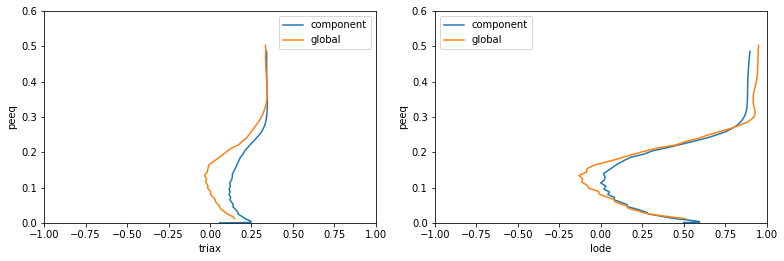

In [15]:
plot_size = (11, 4)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=plot_size)

globalTriax = df_global_plot['globalTriax']
globalLode = df_global_plot['globalLode']
globalPeeq = df_global_plot['globalPeeq']

ax1.plot(compTriax, compPeeq, label='component')
ax1.plot(globalTriax, globalPeeq, label='global')
ax1.set_xlim(-1, 1.0)
ax1.set_ylim(0, 0.6)
ax1.set(xlabel='triax', ylabel='peeq')
ax1.legend()

ax2.plot(compLode, compPeeq, label='component')
ax2.plot(globalLode, globalPeeq, label='global')
ax2.set_xlim(-1, 1)
ax2.set_ylim(0, 0.6)
ax2.set(xlabel='lode', ylabel='peeq')
ax2.legend()

plt.tight_layout()
f.subplots_adjust(top=0.88)

**Calculate local variables**

In [16]:
def calLocal(localElem_file):
    
    # initialize data
    
    localElems = np.loadtxt(localElem_file).tolist()
    localElems = [int(e) for e in localElems]

    localvolume = volume[:, localElems].sum(axis=1)
    localTriax = np.sum(triax[:, localElems] * volume[:, localElems], axis=1)/localvolume
    localLode = np.sum(lode[:, localElems] * volume[:, localElems], axis=1)/localvolume
    localPeeq = np.sum(peeq[:, localElems] * volume[:, localElems], axis=1)/localvolume
    
#-------------------------------------------------------------------------------------------------------------#

    # prepare local dataframe

    data_local = {'localTriax': localTriax, 'localLode': localLode, 'localPeeq': localPeeq} 
    df_local = pd.DataFrame(data_local)


    eta = localTriax
    theta = localLode
    DIL = ( c1*np.exp(-c2*eta) - c3*np.exp(-c4*eta) ) * np.power(theta,2) + c3*np.exp(-c4*eta)
    df_local['localDIL'] = np.around(DIL,3)


    df_local['localPEEQ > DIL'] = np.where(
        df_local['localPeeq'] >= df_local['localDIL'],
        1,
        0,
    )


    diffPeeq = np.diff(np.around(localPeeq,4))
    delPeeq = np.append(0, diffPeeq)
    df_local['local-delPEEQ/DIL'] = delPeeq / DIL

    delPeeqByDIL = df_local['local-delPEEQ/DIL'].values
    df_local['local-DILaccu'] = np.cumsum(delPeeqByDIL)

    df_local['local-DILaccu > 1'] = np.where(
        df_local['local-DILaccu'] >= 1.0,
        1,
        0,
    )

    df_local['surfFac'] = df_global['globalPeeq'] / df_local['localPeeq']
    
    return df_local

In [17]:
def surfFacLocal(df_local):
    
    # find brokenStep, surfFac
    localBrokenStep = 0
    surfFactor = 0
    brokenSeq = 'notDefined'

    for i in range(timeStep_odb):
        if df_local.at[i,'local-DILaccu > 1'] == 1:
            localBrokenStep = i+1
            surfFactor = df_local.at[i,'surfFac']
            break

    if localBrokenStep <= globalBrokenStep:
        brokenSeq = 'local breaks before'
    else:
        brokenSeq = 'global breaks before'

    print(brokenSeq)
    print(localBrokenStep)
    print(round(surfFactor,2))

    return brokenSeq, localBrokenStep, round(surfFactor,2)

In [18]:
def trimForPlot(df_local):
    
    # find first and last index for graph plot
    plot_start_i = 0
    plot_end_i = timeStep_odb-1

    for i in range(timeStep_odb):
        if df_local.at[i,'local-delPEEQ/DIL'] != 0:
            plot_start_i = i
            break

    for i in range(timeStep_odb):
        if np.absolute(df_local.at[timeStep_odb-1-i,'localTriax'] - df_local.at[timeStep_odb-2-i,'localTriax']) < 0.005:
            plot_end_i = timeStep_odb-2-i
            break

    df_local_plot = df_local.iloc[plot_start_i:plot_end_i]
    
    return df_local_plot

In [19]:
def graphPlot2D(df_global_plot, df_local_plot):

    # get data for graph
    globalTriax = df_global_plot['globalTriax']
    globalLode = df_global_plot['globalLode']
    globalPeeq = df_global_plot['globalPeeq']
    
    localTriax = df_local_plot['localTriax']
    localLode = df_local_plot['localLode']
    localPeeq = df_local_plot['localPeeq']
    
    plot_size = (11, 4)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=plot_size)

    # ax1.plot(compTriax, compPeeq, label='component')
    ax1.plot(globalTriax, globalPeeq, label='global')
    ax1.plot(localTriax, localPeeq, label='local')
    # ax1.plot(DILTriax, DIL_constLode, label='DIL')
    ax1.set_xlim(-1, 1.0)
    ax1.set_ylim(0, 0.6)
    ax1.set(xlabel='triax', ylabel='peeq')
    ax1.legend()

    # ax2.plot(compLode, compPeeq, label='component')
    ax2.plot(globalLode, globalPeeq, label='global')
    ax2.plot(localLode, localPeeq, label='local')
    # ax2.plot(DILLode, DIL_constTriax, label='DIL')
    ax2.set_xlim(-1, 1)
    ax2.set_ylim(0, 0.6)
    ax2.set(xlabel='lode', ylabel='peeq')
    ax2.legend()

    plt.tight_layout()
    f.subplots_adjust(top=0.88)

In [20]:
def graphPlot3D(df_global_plot, df_local_plot):

    # get data for graph
    globalTriax = df_global_plot['globalTriax']
    globalLode = df_global_plot['globalLode']
    globalPeeq = df_global_plot['globalPeeq']
    
    localTriax = df_local_plot['localTriax']
    localLode = df_local_plot['localLode']
    localPeeq = df_local_plot['localPeeq']
    
    # plot start
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')

    # plot global scatter result    
    xs = globalTriax
    ys = globalLode
    zs = globalPeeq
    ax.plot(xs, ys, zs, label='global')

    # plot local scatter result    
    xs = localTriax
    ys = localLode
    zs = localPeeq
    localPlot = ax.plot(xs, ys, zs, label='local')

    # plot DIL
    X = np.arange(-1, 1, 0.01)
    Y = np.arange(-1, 1, 0.01)
    X, Y = np.meshgrid(X, Y)
    Z = df_DIL
    ax.plot_wireframe(X, Y, Z, label='DIL')

    # set axis label
    ax.set_xlabel('triax')
    ax.set_ylabel('lode')
    ax.set_zlabel('PEEQ')
    ax.legend()

    plt.show()

In [21]:
# calculate local varibles

list_df_local = []

data_surfFac = {'timeFrame': timeStep} 
df_surfFac = pd.DataFrame(data_surfFac)

f = open('surfFac.txt', 'w')

print('global')
print(globalBrokenStep)
print('\n')
f.write('global' + '\n')
f.write('broken timeStep = ' + str(globalBrokenStep) + '\n' + '\n')


for i in range(localPnt_no):
    
    localElem_file = 'localElems_pnt' + str(i+1) + '.csv'
    pntNo = 'pnt' + str(i+1)
    
    print('local_' + str(pntNo))
    df_local = calLocal(localElem_file)
    list_df_local.append(df_local)
    brokenSeq, localBrokenStep, surfFactor = surfFacLocal(df_local)
    print('\n')
     
    df_surfFac['surfFac_' + pntNo] = df_local['surfFac']
    
    
    # import files
    df_local.to_csv('localVar_' + pntNo + '.csv', index=False)
    
    f.write('pnt' + str(i+1) + '\n')
    f.write(brokenSeq + '\n')
    f.write('broken timeStep = ' + str(localBrokenStep) + '\n')
    f.write('surface factor = ' + str(round(surfFactor,2)) + '\n' + '\n')
    
print('no. of selected local pnt = ' + str(len(list_df_local)))

f.write('no. of selected local pnt = ' + str(len(list_df_local)) + '\n' + '\n')

global
28


local_pnt1
local breaks before
27
0.87


local_pnt2
global breaks before
29
0.89


local_pnt3
local breaks before
26
0.82


no. of selected local pnt = 3


31

In [22]:
# find surfFac of local variable at the timestep which global variable reach DIL

df_surfFac.to_csv('surfFac_allpnts.csv', index=False)
    
surfFacAtGlobal = df_surfFac.iloc[globalBrokenStep-1].values
surfFacAtGlobal = surfFacAtGlobal[1:localPnt_no+1]

min_surfFacAtGlobal = round(np.amin(surfFacAtGlobal), 2)
min_surfFacAtGlobal_index = np.argmin(surfFacAtGlobal) + 1

f.write('min surfFac at global broken = ' + str(min_surfFacAtGlobal) + '\n')
f.write('from pnt ' + str(min_surfFacAtGlobal_index))
f.close()

print(surfFacAtGlobal)
print('\n' + 'min surfFac at global broken = ' + str(min_surfFacAtGlobal))
print('\n' + 'from pnt ' + str(min_surfFacAtGlobal_index))

[0.87789952 0.88105921 0.81704526]

min surfFac at global broken = 0.82

from pnt 3


**Result illustration**

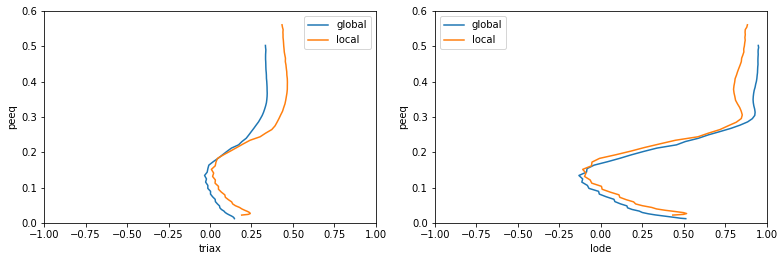

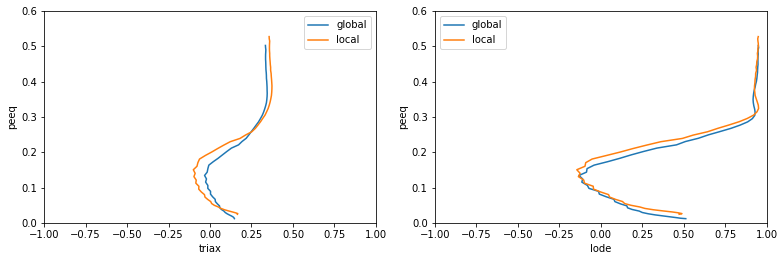

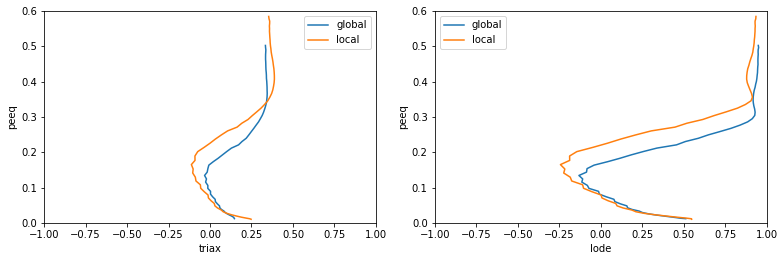

In [23]:
list_df_local_plot = []

for i in range(localPnt_no):
    df_local_plot = trimForPlot(list_df_local[i])
    list_df_local_plot.append(df_local_plot)
    
    graphPlot2D(df_global_plot, df_local_plot)

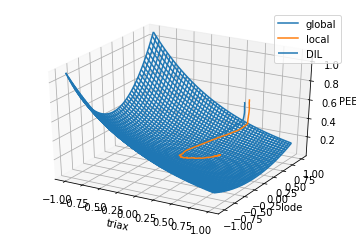

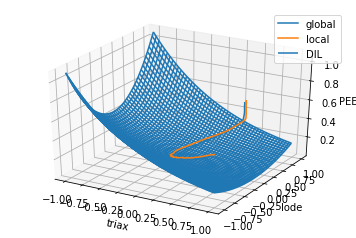

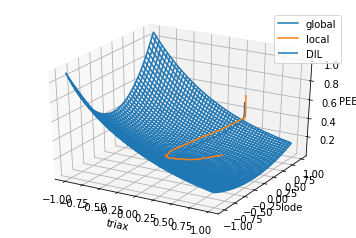

In [24]:
for i in range(localPnt_no):
    
    graphPlot3D(df_global_plot, list_df_local_plot[i])

,timeFrame,surfFac_pnt1,surfFac_pnt2,surfFac_pnt3
0,1,0.541373,0.480202,1.215874
1,2,0.541373,0.480202,1.215874
2,3,0.541373,0.480202,1.215874
3,4,0.541373,0.480202,1.215874
4,5,0.541373,0.480202,1.215874


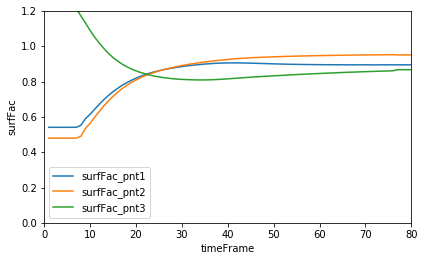

In [25]:
plot_size = (6, 4)
f, (ax) = plt.subplots(1, 1, figsize=plot_size)

for i in range(localPnt_no):
    columnName = 'surfFac_pnt'+str(i+1)
    surfFac = df_surfFac[columnName].values
    ax.plot(timeStep, surfFac, label=columnName)
    ax.set_xlim(0, timeStep_odb)
    ax.set_ylim(0, 1.2)
    ax.set(xlabel='timeFrame', ylabel='surfFac')
    ax.legend()

plt.tight_layout()
f.subplots_adjust(top=0.88)


df_surfFac.head()

**3D plot**

In [26]:
import plotly
import plotly.express as px
import plotly.graph_objects as go

In [27]:
# local point selection

df_local_selectedFor3D = list_df_local_plot[localPnt_for3D - 1]

In [28]:
# prepare data

globalTriax = df_global_plot['globalTriax']
globalLode = df_global_plot['globalLode']
globalPeeq = df_global_plot['globalPeeq']

localTriax = df_local_selectedFor3D['localTriax']
localLode = df_local_selectedFor3D['localLode']
localPeeq = df_local_selectedFor3D['localPeeq']

DILtriax = np.arange(-1, 1, 0.01)
DILlode = np.arange(-1, 1, 0.01)
DILtriax, DILlode = np.meshgrid(DILtriax, DILlode)
DILPeeq = df_DIL

shift_DILPeeq = df_DIL * 0.82

In [29]:
fig = go.Figure(data=[
    
    go.Scatter3d(x=globalTriax, y=globalLode, z=globalPeeq, 
                 opacity=0.8, 
                 marker=dict(size=4),
                 line=dict(width=4),
                 name='micro-global'
                ),
    
    go.Scatter3d(x=localTriax, y=localLode, z=localPeeq,
                 opacity=0.8, 
                 marker=dict(size=4),
                 line=dict(width=4),
                 name='micro-local'
                ),
    
    go.Surface(z=DILPeeq, x=DILtriax, y=DILlode, 
               showscale=False, opacity=0.5
              ), 
    
    go.Surface(z=shift_DILPeeq, x=DILtriax, y=DILlode, 
               showscale=False, opacity=0.5
              )
])


fig.update_layout(margin=dict(l=0, r=0, b=0, t=0),
                  scene = {
                      'xaxis': {'title': 'Triaxiality'}, 'yaxis': {'title': 'Normalized lode'}, 'zaxis': {'title': 'PEEQ'},
                      'aspectratio': {'x': 1, 'y': 1, 'z': 1}
                          }
                 )

fig.show()

In [30]:
plotly.offline.plot(fig, filename='DIL-3D.html')

'DIL-3D.html'